<center><br><b><font size="6">Course "Applied Data Science". Homework #2. Classification<br><br>Kuznetsova Anastasiya, </font><font size="5"><i>BASB2022 group</i></font></b><br><br><font size="5"><i>kuznetsova.nastasy@gmail.com</i></font></center>

## Table of contents
<b>1. The EDA & FE part:</b>  
    1.1. [Exploratory Data Analysis](#expl)  
    1.2. [Feature Engineering](#feat)  
<br>
<b>2. The Model Building part:</b>  
    2.1. [Split the Data](#50)  
    2.2. [Build a Model](#51)  

In your second homework you need to create a model that predicts which passengers survived the Titanic shipwreck.

In [90]:
import numpy as np
import pandas as pd
import pandas_profiling

import os
import sys
import random
import datetime

# scikit-learn
from sklearn import tree
from sklearn import metrics
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split, KFold, GridSearchCV

# visualization
import plotly.offline as py
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
py.init_notebook_mode(connected=True)

import matplotlib.pyplot as plt
%matplotlib inline

# disabling Anaconda warnings
import warnings
warnings.simplefilter('ignore')

**Comment:** Here are the necessary custom graphics (I put them in a separate file because scrolling through their code is a living hell).

In [91]:
from custom_graphs import model_performance, conversion_log_comparison, cat_dist, num_dist, cols_dist_surv

In [92]:
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')

# <a name='expl'>Exploratory Data Analysis</a>  

We check the shape of train and test dataframes and also show a selection of rows, to have an initial image of the data.

In [93]:
train_df.sample(5).head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
96,97,0,1,"Goldschmidt, Mr. George B",male,71.0,0,0,PC 17754,34.6542,A5,C
697,698,1,3,"Mullens, Miss. Katherine ""Katie""",female,NaN,0,0,35852,7.7333,NaN,Q
663,664,0,3,"Coleff, Mr. Peju",male,36.0,0,0,349210,7.4958,NaN,S
720,721,1,2,"Harper, Miss. Annie Jessie ""Nina""",female,6.0,0,1,248727,33.0000,NaN,S
515,516,0,1,"Walker, Mr. William Anderson",male,47.0,0,0,36967,34.0208,D46,S


In [94]:
test_df.sample(5).head()

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
129,1021,3,"Petersen, Mr. Marius",male,24.0,0,0,342441,8.0500,NaN,S
410,1302,3,"Naughton, Miss. Hannah",female,NaN,0,0,365237,7.7500,NaN,Q
230,1122,2,"Sweet, Mr. George Frederick",male,14.0,0,0,220845,65.0000,NaN,S
40,932,3,"Karun, Mr. Franz",male,39.0,0,1,349256,13.4167,NaN,C
7,899,2,"Caldwell, Mr. Albert Francis",male,26.0,1,1,248738,29.0000,NaN,S


In [95]:
print("Train: rows: {} cols: {}".format(train_df.shape[0], train_df.shape[1]))
print("Test:  rows: {} cols: {}".format(test_df.shape[0], test_df.shape[1]))

Train: rows: 891 cols: 12
Test:  rows: 418 cols: 11


In [96]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [97]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  418 non-null    int64  
 1   Pclass       418 non-null    int64  
 2   Name         418 non-null    object 
 3   Sex          418 non-null    object 
 4   Age          332 non-null    float64
 5   SibSp        418 non-null    int64  
 6   Parch        418 non-null    int64  
 7   Ticket       418 non-null    object 
 8   Fare         417 non-null    float64
 9   Cabin        91 non-null     object 
 10  Embarked     418 non-null    object 
dtypes: float64(2), int64(4), object(5)
memory usage: 36.0+ KB


Both **train** and **test** files contains the following values:  

* **PassengerID** - the index of the passenger (in the dataset);  
* **PClass** - the class of the passenger (from 1 to 3);
<br>
<br>&emsp;<i><b>Alternative description: </b> A proxy for socio-economic status (SES):</i>
<br>&emsp;&emsp;&emsp;1st = Upper
<br>&emsp;&emsp;&emsp;2nd = Middle
<br>&emsp;&emsp;&emsp;3rd = Lower
<br>
<br>
* **Name** - the name of the passenger;
* **Sex** - the sex of the passenger (female or male);  
* **Age** - the age (where available) of the passenger;  
* **SibSp** - the number of sibilings / spouses aboard of Titanic;
<br>
<br>&emsp;<i><b>Alternative description: </b> The dataset defines family relations in this way:</i>
<br>&emsp;&emsp;&emsp;Sibling = brother, sister, stepbrother, stepsister
<br>&emsp;&emsp;&emsp;Spouse = husband, wife (mistresses and fiancés were ignored)
<br>
<br>
* **Parch** - the number of parents / children aboard of Titanic;
<br>
<br>&emsp;<i><b>Alternative description: </b> The dataset defines family relations in this way:</i>
<br>&emsp;&emsp;&emsp;Parent = mother, father
<br>&emsp;&emsp;&emsp;Child = daughter, son, stepdaughter, stepson
<br>&emsp;&emsp;&emsp;Some children travelled only with a nanny, therefore parch=0 for them.
<br>
<br>
* **Ticket** - the ticket number;  
* **Fare** - the passenger fare (ticket cost);  
* **Cabin** - the cabin number;  
* **Embarked** - the place of embarcation of the passenger (C = Cherbourg, Q = Queenstown, S = Southampton).  

The **train** data has as well the target value, **Survived**.

It is important, before going to create a model, to have a good understanding of the data. We will therefore explore the various features.

Let's start by checking if there are missing data and unlabeled data.

Next, analyze the dependencies of the target variable on various features, such as Age, Sex, and so on, using approaches similar to those in the first homework.

Draw conclusions about what affects whether the passenger survives, check the distribution of features in the train and test data. 

*Example:*
From the total female passengers, *n*% survived.  
In the same time, from the total male passengers, only m% survived.

**Comment:** Features discovering:
* Features of the test data **are the same as features of the training data except for the Survived feature** (it is the target).
* **Features types:** 
    * **Categorical:** Pclass (ordinal), Name (nominal), Sex (nominal)
    * **Numerical:** Age (continuous), Fare (continuous), SibSp (discrete), Parch (discrete)
    * **Mixed:** Ticket (numeric & alphanumeric), Cabin (alphanumeric)

In [98]:
profile_train = pandas_profiling.ProfileReport(train_df, minimal=False)
profile_train.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [99]:
profile_train = pandas_profiling.ProfileReport(test_df, minimal=False)
profile_train.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Missed values discovering results:**
* **Train Data:**
    * **Age:** 177/891 missed values (19.8% are missed).
    * **Cabin:** 687/891 missed values (77.1% are missed).
    * **Embarked:** 2/891 missed values.
* **Test Data:**
    * **Age:** 86/418 missed values (20.5% are missed).
    * **Cabin:** 327/418 missed values (78.2% are missed).
    * **Fare:** 1/418 missed values.
<br>

**Numerical data distribution discovering results:**
* The survival rate for this data is 38.3%.
* More than 75% of the passengers are below 38 years old.
* There are too few old passengers.
* Most passengers travel alone.
* There are a few outliers in the Fare feature.

The Age function has the right skewness, therefore we will not use the average value, when filling in the missing values.
Fare has a significant positive skewness (most ticket price tags have relatively small values).
<br>

**Categorical data distribution discovering results:**
* There are no duplicated names.
* 64.8% of the passengers are males
* There are duplicated values in the Ticket feature (23.6% are duplicated).
* There are duplicated values in the Cabin feature (27.9% are duplicated).
* 72.4% of the passengers used "S" Embarked.

Duplicate values in Ticket and Cabin features give us the right decision for filling missed values: to fill missed Embarked values with the 'S' type.
<br>

**Correlation:**
* PClass has strong negative correlation with Age and Fare.
* Age has negative correlation with Parch and SibSp.

In [100]:
target = 'Survived'
cat_var = ['Sex', 'Embarked', 'Pclass']
num_var = ['SibSp', 'Parch', 'Age', 'Fare']

In [101]:
cat_dist(train_df, target)

**Comment:** We saw that only 342 (38,4%) survived passengers need to consider more detailed information in order to better understand the data and understand which categories of passengers survived and who did not.

In [102]:
for cat in cat_var:
    cat_dist(train_df, cat)

In [103]:
train_df[num_var].describe()

,SibSp,Parch,Age,Fare
count,891.000000,891.000000,714.000000,891.000000
mean,0.523008,0.381594,29.699118,32.204208
std,1.102743,0.806057,14.526497,49.693429
min,0.000000,0.000000,0.420000,0.000000
25%,0.000000,0.000000,20.125000,7.910400
50%,0.000000,0.000000,28.000000,14.454200
75%,1.000000,0.000000,38.000000,31.000000
max,8.000000,6.000000,80.000000,512.329200


In [104]:
for num in num_var:
    num_dist(pd.DataFrame(train_df[num].dropna()), num)

**Comment:**

Most of the passengers at that time were traveling alone, without their families. The age of passengers also varies from 0.42 to 80 years, with an average of 29.7 years. Fares for these passengers also vary, but what's interesting here is that there are passengers who don't have to pay for this cruise.

As we can see, all of the above variables have outliers. The age variable appears to have an almost normal distribution, but there are some outliers that cause the distribution to shift to the right. Because of this, other variables seem to have the correct skewed distribution.

In [105]:
train_df['Fare_nlog'] = np.log(train_df['Fare'])
train_df['Fare_nlog'] = train_df['Fare_nlog'].replace(np.float64('-inf'), 0)

**Comment:** Let's try to smooth out the skewness of Fare by natural logarithm.

In [106]:
conversion_log_comparison(train_df, 'Fare', train_df, 'Fare_nlog')

In [107]:
train_df[train_df['Fare'] <= 0]

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Fare_nlog
179,180,0,3,"Leonard, Mr. Lionel",male,36.0,0,0,LINE,0.0,NaN,S,0.0
263,264,0,1,"Harrison, Mr. William",male,40.0,0,0,112059,0.0,B94,S,0.0
271,272,1,3,"Tornquist, Mr. William Henry",male,25.0,0,0,LINE,0.0,NaN,S,0.0
277,278,0,2,"Parkes, Mr. Francis ""Frank""",male,NaN,0,0,239853,0.0,NaN,S,0.0
302,303,0,3,"Johnson, Mr. William Cahoone Jr",male,19.0,0,0,LINE,0.0,NaN,S,0.0
413,414,0,2,"Cunningham, Mr. Alfred Fleming",male,NaN,0,0,239853,0.0,NaN,S,0.0
466,467,0,2,"Campbell, Mr. William",male,NaN,0,0,239853,0.0,NaN,S,0.0
481,482,0,2,"Frost, Mr. Anthony Wood ""Archie""",male,NaN,0,0,239854,0.0,NaN,S,0.0
597,598,0,3,"Johnson, Mr. Alfred",male,49.0,0,0,LINE,0.0,NaN,S,0.0
633,634,0,1,"Parr, Mr. William Henry Marsh",male,NaN,0,0,112052,0.0,NaN,S,0.0


In [108]:
num_var = ['SibSp', 'Parch', 'Age', 'Fare', 'Fare_nlog']

In [109]:
cols_dist_surv(train_df, num_var)
cols_dist_surv(train_df, cat_var)

**Comment:** 

* Infants (age<=5) and childrens (between 10 and 15 years old) are most likely to survive.
* Elder passengers (>75) survived.
* Most passengers are between 15 and 40 years old.
* Females are most likely to survive.
* Elder passengers (>=70) are all males.

Apparently, passengers traveling with a small number of family members have a better chance of survival. In addition, a large number of children (<=10 years old) survived this tragedy, while passengers older than them, as a rule, do not survive. We can also see that the number of women who survived was much larger than men (women and children are the first code). Passengers departing from port C seem to have been more fortunate, as many of them survived. Pclass also plays a significant role here, because most of the passengers from 1-Pclass managed to survive or have more priorities for rescue, while passengers with 3-Pclass, as a rule, don't survive.

In [110]:
fig = px.violin(train_df, y='Age', x='Sex', color='Survived', box=True, points='all',
                color_discrete_sequence=[px.colors.sequential.Sunset[2], px.colors.sequential.Sunset[4]], 
                hover_data=train_df.columns)
fig.show()

**Comment:** The survival rate of children for both sexes seems to be good, although the survival rate of boys is higher. As for the elderly (Age > 60 years), the survival rate of older men is usually lower, in contrast to the survival rate of older women, which is usually higher.

In [111]:
def survived_table(feature):
    return train_df[[feature, 'Survived']].groupby([feature], as_index=False).mean().sort_values(by='Survived', ascending=False).set_index(feature).style.background_gradient(low=0.75, high=1)

In [112]:
for cat in cat_var:
    display(survived_table(cat))

,Survived
Sex,
female,0.742038
male,0.188908


,Survived
Embarked,
C,0.553571
Q,0.389610
S,0.336957


,Survived
Pclass,
1,0.629630
2,0.472826
3,0.242363


**Comment:** Conclusions on survival relative to categorical features:
* Females have higher Survival rate (74,2%)
* Passengers who used C Embarked are most likely to survive (compared with Q and S).
* First Pclass passengers are more likely to survive then Seconde Pclass then Third.
<br>

*Maybe the most of 1-Pclass passengers used C Embarked.*

In [113]:
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=('<b>Males</b>',
                                    '<b>Females</b>'),
                    specs=[[{"secondary_y": True}, {"secondary_y": True}]],
                    vertical_spacing=0.02,
                    horizontal_spacing=0.035)

fig.add_trace(px.histogram(train_df[train_df['Sex'] == 'male'], x='Age', color='Survived', opacity=0.7, nbins=20,
                           color_discrete_sequence=[px.colors.sequential.dense[3], px.colors.sequential.dense[10]]).data[1],
                 row=1, col=1)

fig.add_trace(px.histogram(train_df[train_df['Sex'] == 'male'], x='Age', color='Survived', opacity=0.7, nbins=20,
                           color_discrete_sequence=[px.colors.sequential.dense[3], px.colors.sequential.dense[10]]).data[0],
                 row=1, col=1)

fig.add_trace(px.histogram(train_df[train_df['Sex'] == 'female'], x='Age', color='Survived', opacity=0.7, nbins=20,
                           color_discrete_sequence=[px.colors.sequential.dense[10], px.colors.sequential.dense[3]]).data[0],
                 row=1, col=2)

fig.add_trace(px.histogram(train_df[train_df['Sex'] == 'female'], x='Age', color='Survived', opacity=0.7, nbins=20,
                           color_discrete_sequence=[px.colors.sequential.dense[10], px.colors.sequential.dense[3]]).data[1],
                 row=1, col=2)


names = set()
fig.for_each_trace(
    lambda trace:
        trace.update(showlegend=False)
        if (trace.name in names) else names.add(trace.name))

names = {'0': 'Not survived', '1': 'Survived'}
fig.for_each_trace(lambda t: t.update(name=names[t.name]))

fig['layout']['yaxis']['title'] = '<i>count</i>'
fig['layout']['xaxis']['title'] = '<i>Age</i>'
fig['layout']['xaxis2']['title'] = '<i>Age</i>'

fig.update_layout(
    width=980, 
    height=500,
    margin=dict(l=0, r=0, t=40, b=40),
    legend=dict(
        orientation='h',
        yanchor='bottom',
        y=-0.22,
        xanchor='center',
        x=0.5
    )
)

fig.show()

**Comment:**
* Females are most likely to survive.
* Elder passengers (>=70) are all males.

In [114]:
fig = make_subplots(rows=1, cols=3,
                    subplot_titles=('<b>Pclass: 1</b>',
                                    '<b>Pclass: 2</b>',
                                    '<b>Pclass: 3</b>'),
                    vertical_spacing=0.02,
                    horizontal_spacing=0.035)
    
fig.append_trace(px.histogram(train_df[train_df['Pclass'] == 1], x='Age', color='Survived', opacity=0.7, nbins=20,
                              color_discrete_sequence=[px.colors.sequential.dense[10], px.colors.sequential.dense[3]]).data[1],
                 row=1, col=1)

fig.append_trace(px.histogram(train_df[train_df['Pclass'] == 1], x='Age', color='Survived', opacity=0.7, nbins=20,
                              color_discrete_sequence=[px.colors.sequential.dense[10], px.colors.sequential.dense[3]]).data[0],
                 row=1, col=1)

fig.append_trace(px.histogram(train_df[train_df['Pclass'] == 2], x='Age', color='Survived', opacity=0.7, nbins=20,
                              color_discrete_sequence=[px.colors.sequential.dense[10], px.colors.sequential.dense[3]]).data[0],
                 row=1, col=2)

fig.append_trace(px.histogram(train_df[train_df['Pclass'] == 2], x='Age', color='Survived', opacity=0.7, nbins=20,
                              color_discrete_sequence=[px.colors.sequential.dense[10], px.colors.sequential.dense[3]]).data[1],
                 row=1, col=2)

fig.append_trace(px.histogram(train_df[train_df['Pclass'] == 3], x='Age', color='Survived', opacity=0.7, nbins=20,
                              color_discrete_sequence=[px.colors.sequential.dense[3], px.colors.sequential.dense[10]]).data[1],
                 row=1, col=3)

fig.append_trace(px.histogram(train_df[train_df['Pclass'] == 3], x='Age', color='Survived', opacity=0.7, nbins=20,
                              color_discrete_sequence=[px.colors.sequential.dense[3], px.colors.sequential.dense[10]]).data[0],
                 row=1, col=3)

names = set()
fig.for_each_trace(
    lambda trace:
        trace.update(showlegend=False)
        if (trace.name in names) else names.add(trace.name))

names = {'0': 'Not survived', '1': 'Survived'}
fig.for_each_trace(lambda t: t.update(name=names[t.name]))

fig['layout']['yaxis']['title'] = '<i>count</i>'
fig['layout']['xaxis']['title'] = '<i>Age</i>'
fig['layout']['xaxis2']['title'] = '<i>Age</i>'
fig['layout']['xaxis3']['title'] = '<i>Age</i>'

fig.update_layout(
    width=980, 
    height=500,
    margin=dict(l=0, r=0, t=40, b=40),
    legend=dict(
        orientation='h',
        yanchor='bottom',
        y=-0.22,
        xanchor='center',
        x=0.5
    )
)

fig.show()

**Comment:** 
* Pclass=3 had most passengers, most if them didn't survive.
* Infant passengers in Pclass=2 and Pclass=3 mostly survived.
* Most passengers in Pclass=1 survived.

# <a name='feat'>Feature Engineering</a>  

**Comment:** Let's process the missing values, form new features (for example, group numeric values and present them as categorical).

In [115]:
datasets = [train_df, test_df]
train_df.drop('PassengerId', axis=1, inplace=True)
train_df['Embarked'].fillna(train_df['Embarked'].dropna().max(), inplace=True)
test_df['Fare'].fillna(test_df['Fare'].dropna().median(), inplace=True)
test_df['Fare_nlog'] = np.log(test_df['Fare'])
test_df['Fare_nlog'] = test_df['Fare_nlog'].replace(np.float64('-inf'), 0)

suppose_ages = np.zeros((2,3))

for dataset in datasets:
    
    dataset.drop(columns=['Ticket' , 'Cabin'], axis=1, inplace=True)
    dataset['Sex'] = dataset['Sex'].map({'female': 1, 'male': 0}).astype(int)
    dataset['Embarked'] = dataset['Embarked'].dropna().map({'S': 0, 'C': 1, 'Q': 2}).astype(int)
    
    for i in range(2):
        for j in range(3):
            suppose_df = dataset[(dataset['Sex'] == i) & (dataset['Pclass'] == j + 1)]['Age'].dropna()
            age_suppose = suppose_df.median()
            
            # Convert random age float to nearest .5 age
            suppose_ages[i, j] = int(age_suppose / 0.5 + 0.5 ) * 0.5
            
    for i in range(2):
        for j in range(3):
            dataset.loc[(dataset['Age'].isnull()) & (dataset['Sex'] == i) & (dataset['Pclass'] == j + 1), 'Age'] = suppose_ages[i, j]

    dataset['Age'] = dataset['Age'].astype(int)

In [116]:
display(pd.DataFrame(train_df.isnull().sum(), columns=['Missing']))
display(pd.DataFrame(test_df.isnull().sum(), columns=['Missing']))

,Missing
Survived,0
Pclass,0
Name,0
Sex,0
Age,0
SibSp,0
Parch,0
Fare,0
Embarked,0
Fare_nlog,0


,Missing
PassengerId,0
Pclass,0
Name,0
Sex,0
Age,0
SibSp,0
Parch,0
Fare,0
Embarked,0
Fare_nlog,0


In [117]:
train_df['AgeGroup'] = pd.cut(train_df['Age'], 5)
train_df[['AgeGroup', 'Survived']].groupby(['AgeGroup'], as_index=False).mean().sort_values(by='AgeGroup', ascending=True)

,AgeGroup,Survived
0,"(-0.08, 16.0]",0.550000
1,"(16.0, 32.0]",0.337374
2,"(32.0, 48.0]",0.412037
3,"(48.0, 64.0]",0.434783
4,"(64.0, 80.0]",0.090909


In [118]:
train_df['AgeGroupNum'] = train_df['Age']
test_df['AgeGroupNum'] = test_df['Age']

In [119]:
for dataset in datasets:
    dataset.loc[dataset['AgeGroupNum'] <= 16, 'AgeGroupNum'] = 0
    dataset.loc[(dataset['AgeGroupNum'] > 16) & (dataset['AgeGroupNum'] <= 32), 'AgeGroupNum'] = 1
    dataset.loc[(dataset['AgeGroupNum'] > 32) & (dataset['AgeGroupNum'] <= 48), 'AgeGroupNum'] = 2
    dataset.loc[(dataset['AgeGroupNum'] > 48) & (dataset['AgeGroupNum'] <= 64), 'AgeGroupNum'] = 3
    dataset.loc[dataset['AgeGroupNum'] > 64, 'AgeGroupNum'] = 4

In [120]:
train_df.head()

,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Fare,Embarked,Fare_nlog,AgeGroup,AgeGroupNum
0,0,3,"Braund, Mr. Owen Harris",0,22,1,0,7.2500,0,1.981001,"(16.0, 32.0]",1
1,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",1,38,1,0,71.2833,1,4.266662,"(32.0, 48.0]",2
2,1,3,"Heikkinen, Miss. Laina",1,26,0,0,7.9250,0,2.070022,"(16.0, 32.0]",1
3,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",1,35,1,0,53.1000,0,3.972177,"(32.0, 48.0]",2
4,0,3,"Allen, Mr. William Henry",0,35,0,0,8.0500,0,2.085672,"(32.0, 48.0]",2


In [121]:
for dataset in datasets:
    dataset['FamilySize'] = dataset['SibSp'] + dataset['Parch'] + 1

# train_df.drop(['Parch', 'SibSp'], axis=1, inplace=True)
# test_df.drop(['Parch', 'SibSp'], axis=1, inplace=True)    

train_df[['FamilySize', 'Survived']].groupby(['FamilySize'], as_index=False).mean().sort_values(by='Survived', ascending=False)

,FamilySize,Survived
3,4,0.724138
2,3,0.578431
1,2,0.552795
6,7,0.333333
0,1,0.303538
4,5,0.200000
5,6,0.136364
7,8,0.000000
8,11,0.000000


In [122]:
for dataset in datasets:
    dataset['Single'] = dataset['FamilySize'].map(lambda s: 1 if s == 1 else 0)
    dataset['SmallF'] = dataset['FamilySize'].map(lambda s: 1 if  s == 2  else 0)
    dataset['MedF'] = dataset['FamilySize'].map(lambda s: 1 if 3 <= s <= 4 else 0)
    dataset['LargeF'] = dataset['FamilySize'].map(lambda s: 1 if s >= 5 else 0)
    
# train_df.drop('FamilySize', axis=1, inplace=True)
# test_df.drop('FamilySize', axis=1, inplace=True)

In [123]:
train_df.head()

,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Fare,Embarked,Fare_nlog,AgeGroup,AgeGroupNum,FamilySize,Single,SmallF,MedF,LargeF
0,0,3,"Braund, Mr. Owen Harris",0,22,1,0,7.2500,0,1.981001,"(16.0, 32.0]",1,2,0,1,0,0
1,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",1,38,1,0,71.2833,1,4.266662,"(32.0, 48.0]",2,2,0,1,0,0
2,1,3,"Heikkinen, Miss. Laina",1,26,0,0,7.9250,0,2.070022,"(16.0, 32.0]",1,1,1,0,0,0
3,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",1,35,1,0,53.1000,0,3.972177,"(32.0, 48.0]",2,2,0,1,0,0
4,0,3,"Allen, Mr. William Henry",0,35,0,0,8.0500,0,2.085672,"(32.0, 48.0]",2,1,1,0,0,0


In [124]:
for dataset in datasets:
    dataset['Title'] = dataset['Name'].str.extract(' ([A-Za-z]+)\.', expand=False)

pd.crosstab(train_df['Title'], train_df['Sex'])

Sex,0,1
Title,,
Capt,1,0
Col,2,0
Countess,0,1
Don,1,0
Dr,6,1
Jonkheer,1,0
Lady,0,1
Major,2,0
Master,40,0


In [125]:
for dataset in datasets:
    dataset['Title'] = dataset['Title'].replace(['Lady', 'Countess', 'Capt', 'Col', 
                                                 'Don', 'Dr', 'Major', 'Rev', 'Sir', 
                                                 'Jonkheer', 'Dona'], 'Rare')
    dataset['Title'] = dataset['Title'].replace('Mlle', 'Miss')
    dataset['Title'] = dataset['Title'].replace('Ms', 'Miss')
    dataset['Title'] = dataset['Title'].replace('Mme', 'Mrs')
    
train_df[['Title', 'Survived']].groupby(['Title'], as_index=False).mean()

,Title,Survived
0,Master,0.575000
1,Miss,0.702703
2,Mr,0.156673
3,Mrs,0.793651
4,Rare,0.347826


In [126]:
title_mapping = {'Mr': 1, 'Miss': 2, 'Mrs': 3, 'Master': 4, 'Rare': 5}

for dataset in datasets:
    dataset['Title'] = dataset['Title'].map(title_mapping)
    dataset['Title'] = dataset['Title'].fillna(0)

In [127]:
train_df.head()

,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Fare,Embarked,Fare_nlog,AgeGroup,AgeGroupNum,FamilySize,Single,SmallF,MedF,LargeF,Title
0,0,3,"Braund, Mr. Owen Harris",0,22,1,0,7.2500,0,1.981001,"(16.0, 32.0]",1,2,0,1,0,0,1
1,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",1,38,1,0,71.2833,1,4.266662,"(32.0, 48.0]",2,2,0,1,0,0,3
2,1,3,"Heikkinen, Miss. Laina",1,26,0,0,7.9250,0,2.070022,"(16.0, 32.0]",1,1,1,0,0,0,2
3,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",1,35,1,0,53.1000,0,3.972177,"(32.0, 48.0]",2,2,0,1,0,0,3
4,0,3,"Allen, Mr. William Henry",0,35,0,0,8.0500,0,2.085672,"(32.0, 48.0]",2,1,1,0,0,0,1


In [128]:
test_df.head()

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Fare,Embarked,Fare_nlog,AgeGroupNum,FamilySize,Single,SmallF,MedF,LargeF,Title
0,892,3,"Kelly, Mr. James",0,34,0,0,7.8292,2,2.057860,2,1,1,0,0,0,1
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",1,47,1,0,7.0000,0,1.945910,2,2,0,1,0,0,3
2,894,2,"Myles, Mr. Thomas Francis",0,62,0,0,9.6875,2,2.270836,3,1,1,0,0,0,1
3,895,3,"Wirz, Mr. Albert",0,27,0,0,8.6625,0,2.159003,1,1,1,0,0,0,1
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",1,22,1,1,12.2875,0,2.508582,1,3,0,0,1,0,3


## <a id='50'>Split the Data</a>  

Let's split the training and validation set. We will use a 80-20 split. Don't forget to fix random_state. 


In [129]:
X = train_df.drop(columns=[target])
y = train_df[target]

X_train_df, X_validation_df, y_train_df, y_validation_df = train_test_split(X, y, test_size=0.2, random_state=42)

## <a id='51'>Build a Model</a>  

In [130]:
def make_preprocessor(categorical, numeric, scaler, encoder):
    
    numeric_transformer = Pipeline(
        steps=[
            ('scaler', scaler)
        ])
    
    categorical_transformer = Pipeline(
        steps=[
            ('encoder', encoder)
        ])
    
    preprocessor = ColumnTransformer(
       transformers=[
           ('numeric', numeric_transformer, numeric),
           ('categorical', categorical_transformer, categorical),
       ])
    
    return preprocessor

def make_pipeline(preprocessor, model):
    
    pipeline = Pipeline(
        steps=[
            ('preprocessor', preprocessor),
            ('regressor', model)
        ])
    
    return pipeline

def search_parameters(pipeline, train_data, train_target, params):
    
    kf = KFold(n_splits=5, shuffle=True)
    
    grid = GridSearchCV(pipeline, param_grid=params, cv=kf, scoring='roc_auc')
    grid.fit(train_data, train_target)
    
    return grid.best_estimator_, grid.best_params_

def fit_pipeline(pipeline, train_data, train_target, test_data):
    
    pipeline.fit(train_data, train_target)
    
    fig, ax = plt.subplots(figsize=(16, 16))
    
    if str(pipeline['regressor']).split('(')[0] == 'DecisionTreeClassifier':
        tree.plot_tree(pipeline['regressor'], filled=True) # decision tree
    
    elif str(pipeline['regressor']).split('(')[0]  == 'RandomForestClassifier':
        tree.plot_tree(pipeline['regressor'].estimators_[0], filled=True) # one of the decision trees in random forest

    plt.show()
    
    y_preds = pipeline.predict(test_data)
    y_score = pipeline.predict_proba(test_data)[:, 1]
    
    return y_preds, y_score

We will start with a simple model (baseline), with just few predictors.

We start with two predictors, the `Sex` and `Pclass`. Create DecisionTreeClassifier and RandomForestClassifier, based on this features, without tuning parameters.

In [131]:
categorical_columns = ['Pclass']
numeric_columns = ['Sex']

In [132]:
preprocessors = make_preprocessor(categorical_columns, numeric_columns, 
                                  None, OneHotEncoder(handle_unknown='ignore'))

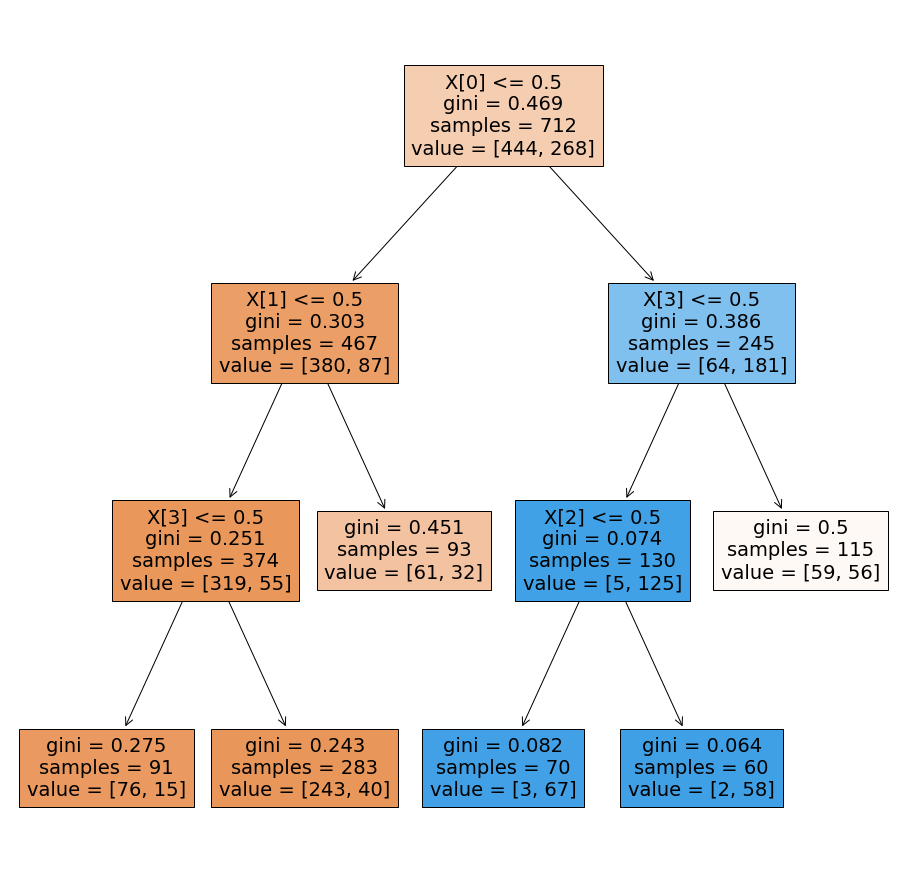

In [133]:
pipeline = make_pipeline(preprocessors, 
                         DecisionTreeClassifier())
fitted_pipeline = fit_pipeline(pipeline, X_train_df, y_train_df, X_validation_df)

In [134]:
model_performance('Decision Tree Classifier', y_validation_df, fitted_pipeline[0], fitted_pipeline[1])

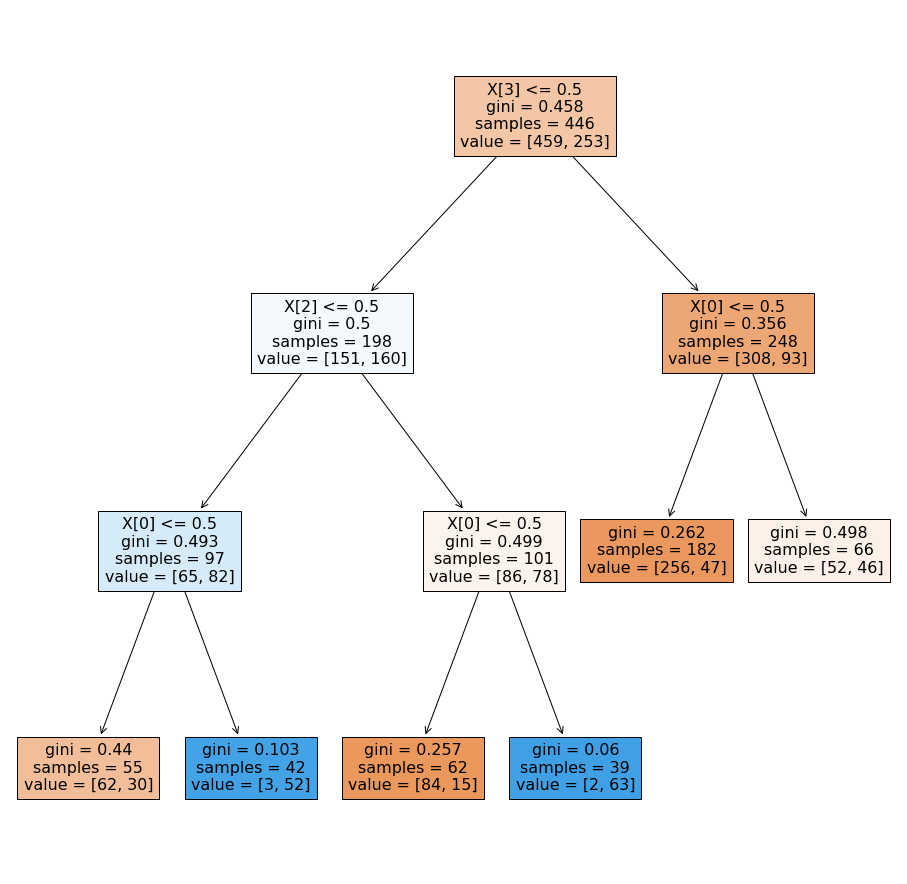

In [135]:
pipeline = make_pipeline(preprocessors,
                         RandomForestClassifier())
fitted_pipeline = fit_pipeline(pipeline, X_train_df, y_train_df, X_validation_df)

In [136]:
model_performance('Random Forest Classifier', y_validation_df, fitted_pipeline[0], fitted_pipeline[1])

**Comment:** Without a selection of hyperparameters, using the same features, Decision Tree Classifier and Random Forest Classifier showed completely identical results for all metrics, but different tree models.

Next, create two more complicated models: DecisionTreeClassifier and RandomForestClassifier with adding at least one feature that you found useful as a result of your analysis.

Find accuracy score for all models. Is it a good idea to use accuracy? Any suggestions about metrics?

* **Accuracy** shows us how comfortable the model is with detecting the positive and negative classes. It’s computed by the sum of True Positives and True Negatives divided by the total.
* **Precision** tells us about the success probability of making a correct positive class classification. It’s computed as the number of True Positives divided by the total number of positive calls.
* **Recall** explains how sensitive the model is towards identifying the positive class. It’s computed as the number of True Positives divided by the sum of True Positives and False Negatives.
* A common evaluative tool is the **ROC curve**. ROC curves are graphs that plot a model’s false-positive rate against its true-positive rate across a range of classification thresholds; that is, across various cutoffs used to split real-valued model outputs (such as probabilities) into binary predictions. **ROC-AUC score** is one of the major metrics to assess the performance of a classification model. ROC-AUC is indicative of degree of separability/distinction or intermingling/crossover between the predictions of the two classes. Higher the score, higher the distinction and lower the crossover of the predictions of the two classes.

To evaluate the models, first of all, I will use **ROC-AUC score**.

Then try to tune at least one parameter for every model using grid search and write down features and parameters, which gave you best score. 

**Comment:** Based on the EDA, I selected the formed (including new) features that potentially have the greatest impact on the target variable.

In [137]:
categorical_columns = ['Pclass', 'AgeGroupNum', 'Embarked']
numeric_columns = ['Fare_nlog', 'Sex', 'Single']

In [138]:
preprocessors = make_preprocessor(categorical_columns, numeric_columns, 
                                  StandardScaler(), OneHotEncoder(handle_unknown='ignore'))

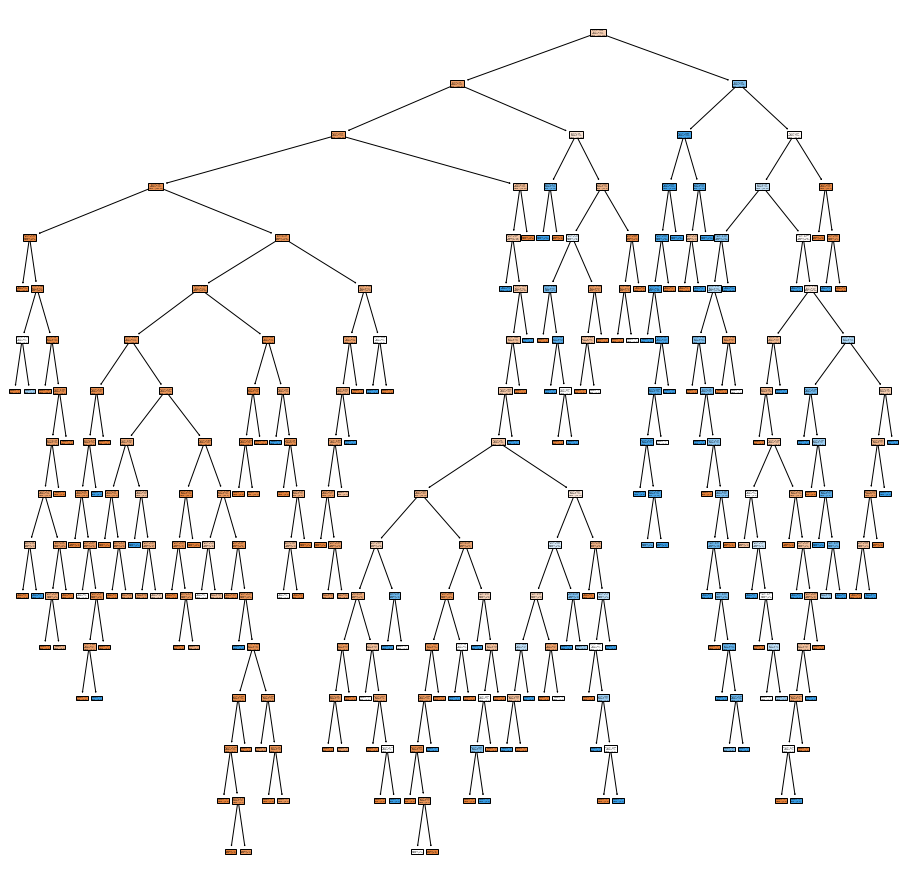

In [139]:
pipeline = make_pipeline(preprocessors,
                         DecisionTreeClassifier())
fitted_pipeline = fit_pipeline(pipeline, X_train_df, y_train_df, X_validation_df)

In [140]:
model_performance('Decision Tree Classifier', y_validation_df, fitted_pipeline[0], fitted_pipeline[1])

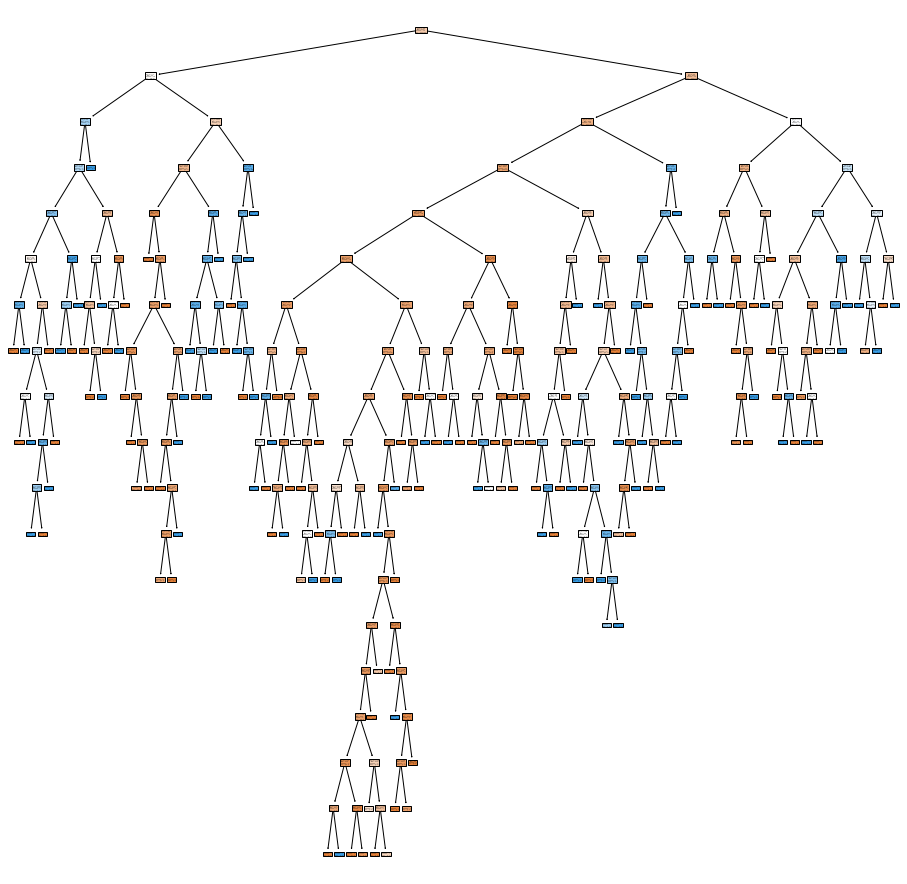

In [141]:
pipeline = make_pipeline(preprocessors,
                         RandomForestClassifier())
fitted_pipeline = fit_pipeline(pipeline, X_train_df, y_train_df, X_validation_df)

In [142]:
model_performance('Random Forest Classifier', y_validation_df, fitted_pipeline[0], fitted_pipeline[1])

**Comment:** Random Forest Classifier showed better binary classification results compared to Decision Trees Classifier. Let's try to tune some hyperparameters.

In [54]:
params = {'regressor__max_leaf_nodes': list(range(2, 100)), 'regressor__min_samples_split': [2, 3, 4]}

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['Fare_nlog', 'Sex',
                                                   'Single']),
                                                 ('categorical',
                                                  Pipeline(steps=[('encoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Pclass', 'AgeGroupNum',
                                                   'Embarked'])])),
                ('regressor', DecisionTreeClassifier(max_leaf_nodes=7))])


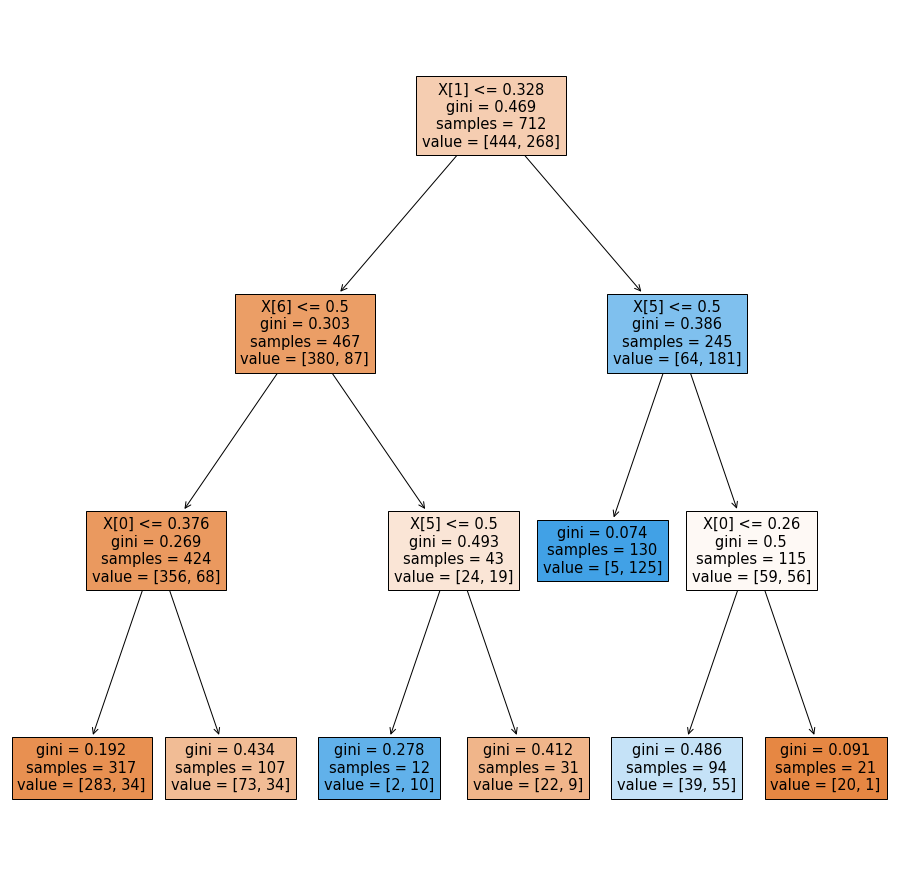

In [55]:
pipeline = make_pipeline(preprocessors,
                         DecisionTreeClassifier())

best_params_dt = search_parameters(pipeline, X_train_df, y_train_df, params)
print(best_params_dt[0])

fitted_pipeline = fit_pipeline(best_params_dt[0], X_train_df, y_train_df, X_validation_df)

In [56]:
model_performance('Decision Tree Classifier', y_validation_df, fitted_pipeline[0], fitted_pipeline[1])

In [57]:
params = {'regressor__max_depth': [10, 20, 40, 60, 80, 100, None],
          'regressor__min_samples_leaf': [1, 2],
          'regressor__min_samples_split': [2, 5],
          'regressor__n_estimators': [200, 400, 600, 800]}

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['Fare_nlog', 'Sex',
                                                   'Single']),
                                                 ('categorical',
                                                  Pipeline(steps=[('encoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Pclass', 'AgeGroupNum',
                                                   'Embarked'])])),
                ('regressor',
                 RandomForestClassifier(max_depth=10, min_samples_leaf=2,
                                        n_estimators=200))])


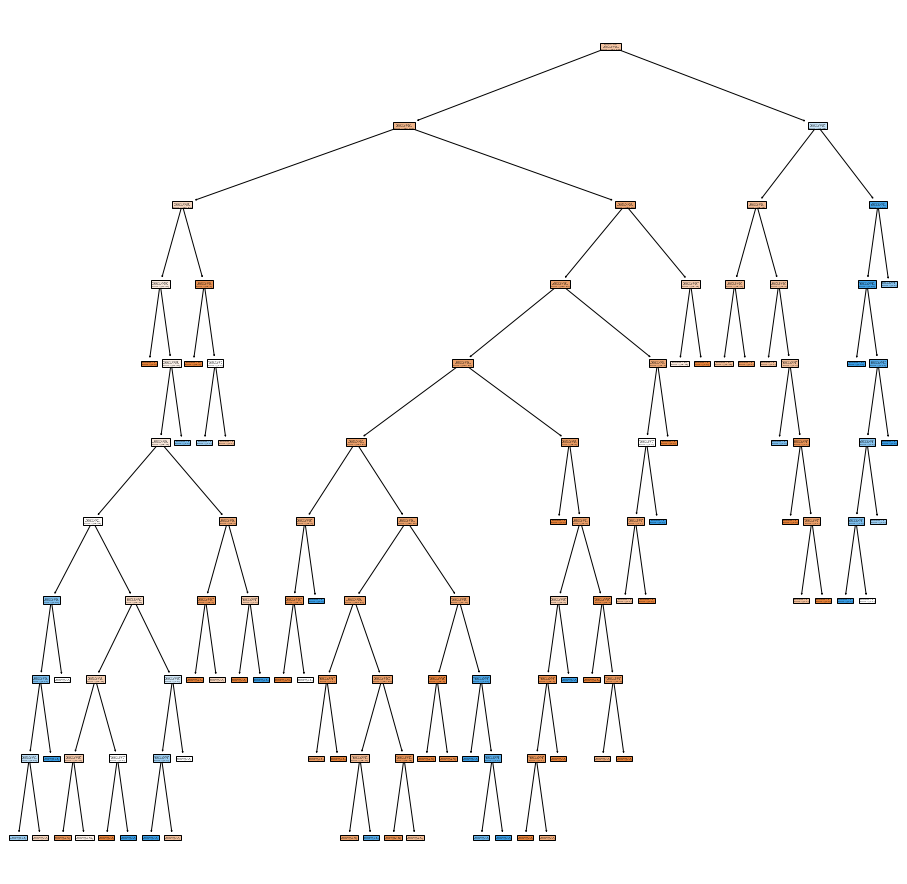

In [58]:
pipeline = make_pipeline(preprocessors,
                         RandomForestClassifier())

best_params_rf = search_parameters(pipeline, X_train_df, y_train_df, params)
print(best_params_rf[0])

fitted_pipeline = fit_pipeline(best_params_rf[0], X_train_df, y_train_df, X_validation_df)

In [59]:
model_performance('Random Forest Classifier', y_validation_df, fitted_pipeline[0], fitted_pipeline[1])

**Comment:** In general, both models predict well whether a person will survive (on a validation sample 0.85 < ROC-AUC < 0.9) (with the selection of hyperparameters, the result of the models as a whole improved by ~ 0.2-0.3, but the Random Forest still shows a higher result). Next, we will predict for each person in the test sample will survive (using both models with the best params).

In [143]:
PassengerId_list = test_df['PassengerId'].to_list()

In [144]:
X.drop(['AgeGroup'], axis=1, inplace=True)
test_df.drop(['PassengerId'], axis=1, inplace=True)

In [145]:
X.columns

Index(['Pclass', 'Name', 'Sex', 'Age', 'SibSp', 'Parch', 'Fare', 'Embarked',
       'Fare_nlog', 'AgeGroupNum', 'FamilySize', 'Single', 'SmallF', 'MedF',
       'LargeF', 'Title'],
      dtype='object')

In [146]:
test_df.columns

Index(['Pclass', 'Name', 'Sex', 'Age', 'SibSp', 'Parch', 'Fare', 'Embarked',
       'Fare_nlog', 'AgeGroupNum', 'FamilySize', 'Single', 'SmallF', 'MedF',
       'LargeF', 'Title'],
      dtype='object')

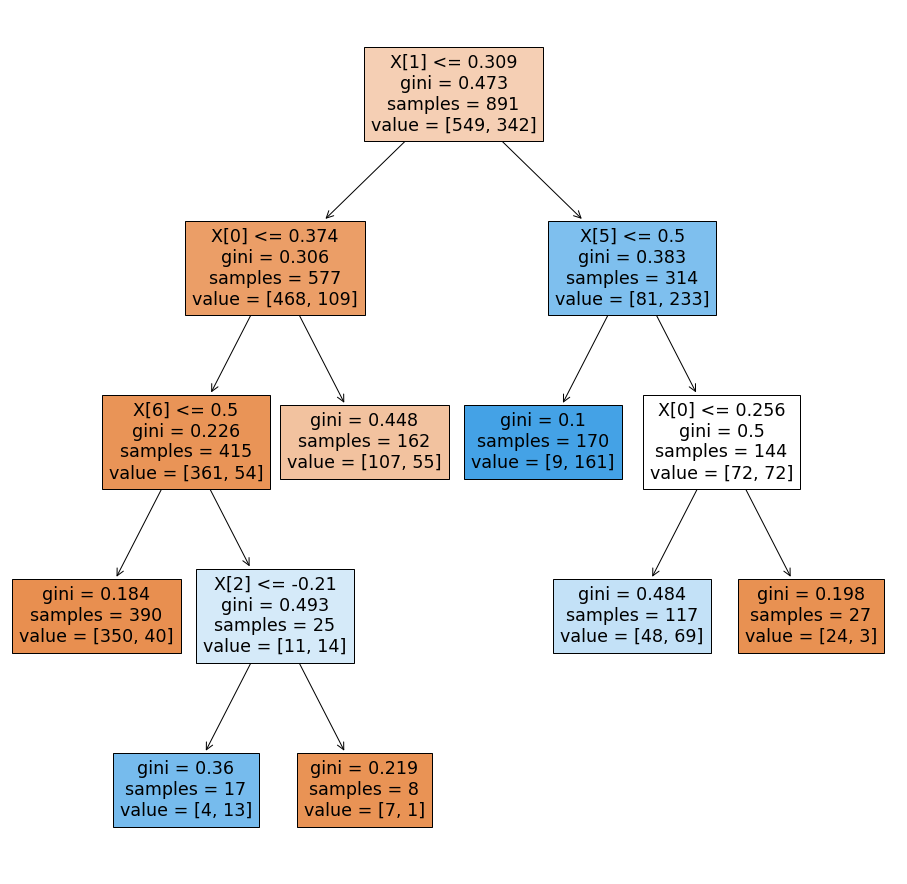

In [147]:
fitted_pipeline = fit_pipeline(best_params_dt[0], X, y, test_df)

In [148]:
test_df['Survived_dt'] = fitted_pipeline[0]

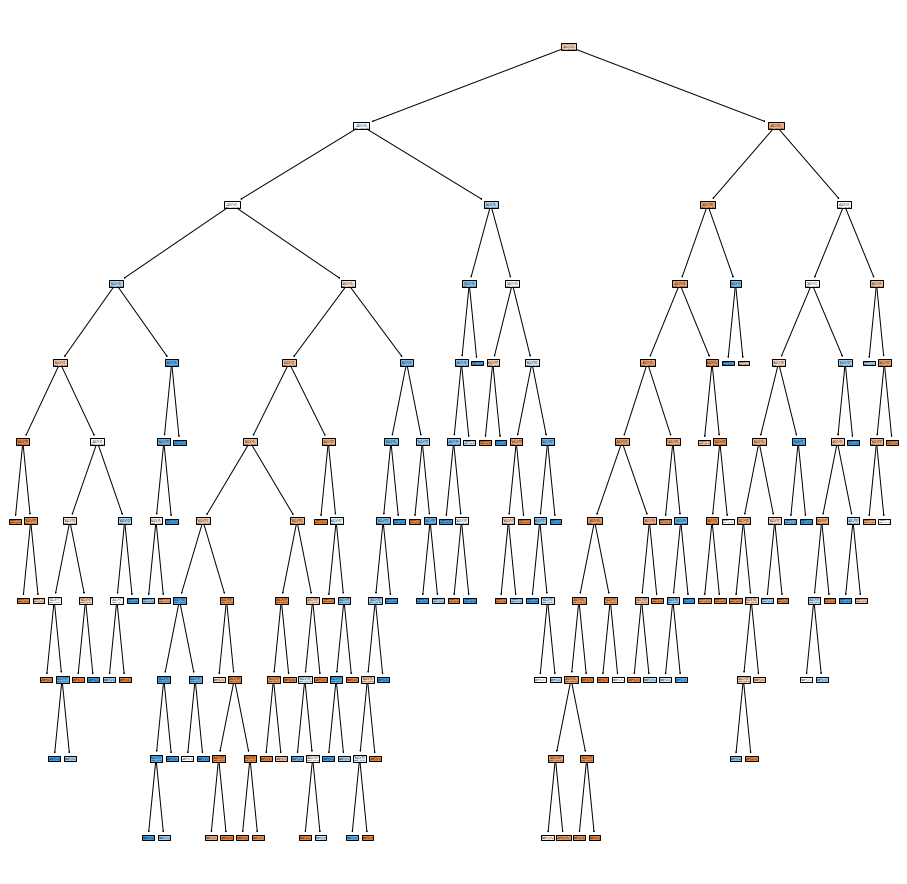

In [149]:
fitted_pipeline = fit_pipeline(best_params_rf[0], X, y, test_df)

In [150]:
test_df['Survived_rf'] = fitted_pipeline[0]

In [151]:
test_df['PassengerId'] = PassengerId_list

In [154]:
dt_df_res = pd.DataFrame(test_df[['Survived_dt', 'PassengerId']].groupby('Survived_dt', as_index=False)['PassengerId'].count())
dt_df_res['PassengerId_perc'] = dt_df_res.PassengerId / dt_df_res.PassengerId.sum() * 100

In [155]:
dt_df_res

,Survived_dt,PassengerId,PassengerId_perc
0,0,262,62.679426
1,1,156,37.320574


In [156]:
rf_df_res = pd.DataFrame(test_df[['Survived_rf', 'PassengerId']].groupby('Survived_rf', as_index=False)['PassengerId'].count())
rf_df_res['PassengerId_perc'] = rf_df_res.PassengerId / rf_df_res.PassengerId.sum() * 100

In [157]:
rf_df_res

,Survived_rf,PassengerId,PassengerId_perc
0,0,267,63.875598
1,1,151,36.124402


**Comment:** We see that in general, the distribution of survivors for both models in the test sample is similar to that in the training sample (~ 63% will not survive, ~ 37% will survive). Taking into account the good result at the training stages of building models, I think we can say that the results of the classification of the model on the test sample look plausible.